### 135 Stable Baselines Walker 2D with PPO

#### PPO - Proximal optimization policy

PPO belongs to the family of policy gradient methods and optimizes a stochastic policy by directly 
adjusting its parameters to maximize expected rewards. Its key innovation is the clipped surrogate objective, 
which limits how much the new policy can deviate from the old one during each update, ensuring controlled 
learning and preventing destructive policy updates.

In Stable-Baselines3, PPO uses two neural networks: a policy (actor) that outputs the probability 
distribution over actions and a value function (critic) that estimates the expected return. 
The training process alternates between collecting experience through environment interactions 
and performing multiple epochs of optimization on mini-batches of that experience. 
PPO supports both continuous and discrete action space

This program is a fine tuned PPO algorithm with Walker 2D gymnasium environment
It is working with gymnasium 1.2, mujoco 2.3.3 and walker_2d_v5

For a million iterations it takes 3-4 hours in a Laptop with a GPU

In [1]:
import gymnasium as gym
import numpy as np
from stable_baselines3 import PPO, SAC, TD3
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import EvalCallback, CheckpointCallback, BaseCallback
from stable_baselines3.common.vec_env import DummyVecEnv, VecNormalize
from stable_baselines3.common.monitor import Monitor

import matplotlib.pyplot as plt
import os
import torch
from PIL import Image
import time

2025-10-27 08:15:41.722645: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-27 08:15:41.903069: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-10-27 08:15:41.980649: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-10-27 08:15:42.002585: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-10-27 08:15:42.137523: I tensorflow/core/platform/cpu_feature_guar

In [2]:
TOTAL_STEPS = 2_000_000
SEED = 42
timestamp = time.strftime("%Y%m%d-%H%M%S")

In [3]:
# Check if CUDA is available
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    print(f"Current GPU: {torch.cuda.current_device()}")
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("No GPU detected - training will use CPU")

# Check what device Stable Baselines3 will use
print("\n" + "=" * 50)
print("Stable Baselines3 Device")
print("=" * 50)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"SB3 will use: {device}")
print("cuda = GPU")

PyTorch version: 2.4.0+cu121
CUDA available: True
CUDA version: 12.1
Number of GPUs: 1
Current GPU: 0
GPU Name: NVIDIA T600 Laptop GPU
GPU Memory: 4.29 GB

Stable Baselines3 Device
SB3 will use: cuda
cuda = GPU


In [4]:
filename = "Walker2d-5M"

In [5]:
# Test Environment Walker 2D
env = gym.make("Walker2d-v5", render_mode="human")
print(f"Observation space: {env.observation_space}")
print(f"Action space: {env.action_space}")
print(f"Observation shape: {env.observation_space.shape}")
print(f"Action shape: {env.action_space.shape}")

Observation space: Box(-inf, inf, (17,), float64)
Action space: Box(-1.0, 1.0, (6,), float32)
Observation shape: (17,)
Action shape: (6,)


In [6]:
# %% Test random agent
obs, info = env.reset()
print(f"\nInitial observation: {obs}")
total_reward = 0
for _ in range(10000):
    action = env.action_space.sample()
    obs, reward, terminated, truncated, info = env.step(action)
    env.render()
    total_reward += reward
    if terminated or truncated:
       break

print(f"Random agent total reward over {_+1} steps: {total_reward:.2f}")
env.close()


Initial observation: [ 1.24670353e+00 -2.07431492e-03  1.26953356e-03 -4.31568264e-03
 -1.56466947e-03 -4.28485828e-03 -1.31611128e-03  4.82326781e-03
 -2.95255935e-03 -4.93053576e-03 -6.07425278e-04  1.85355286e-03
  4.78113513e-03  2.11454137e-04  8.63355710e-04 -1.04946672e-03
 -3.29268661e-03]
Random agent total reward over 11 steps: -1.91


In [7]:
def make_env():
    """Create and wrap the environment"""
    env = gym.make("Walker2d-v5")
    env = Monitor(env, filename=f'./logs/walker_PPO_{timestamp}')
    env = Monitor(env)
    return env
train_env = DummyVecEnv([make_env])
# Normalize observations and rewards
train_env = VecNormalize(train_env, norm_obs=True, norm_reward=True, clip_obs=10.)

# Evaluation environment
eval_env = DummyVecEnv([make_env])
eval_env = VecNormalize(eval_env, norm_obs=True, norm_reward=False, training=False)

In [8]:
# Callbacks
# %% Create directories and callbacks
os.makedirs("./logs/", exist_ok=True)
os.makedirs("./models/", exist_ok=True)

# Evaluation callback
eval_callback = EvalCallback(
    eval_env,
    best_model_save_path="./models/best_model",
    log_path="./logs/eval",
    eval_freq=10000,
    deterministic=True,
    render=False,
    n_eval_episodes=5
)

# Checkpoint callback
checkpoint_callback = CheckpointCallback(
    save_freq=50000,
    save_path="./models/checkpoints",
    name_prefix="walker2d_model"
)

class LearningRateScheduler(BaseCallback):
    """Gradually decrease learning rate over training"""
    def __init__(self, initial_lr=3e-4, final_lr=1e-5, total_timesteps=3000000):
        super().__init__()
        self.initial_lr = initial_lr
        self.final_lr = final_lr
        self.total_timesteps = total_timesteps
        
    def _on_step(self):
        # Calculate progress (0 to 1)
        progress = min(self.num_timesteps / self.total_timesteps, 1.0)
        
        # Linear decay
        current_lr = self.initial_lr - (self.initial_lr - self.final_lr) * progress
        
        # Update learning rate in optimizer
        for param_group in self.model.policy.optimizer.param_groups:
            param_group['lr'] = current_lr
        
        # Log it (optional)
        if self.n_calls % 10000 == 0:
            self.logger.record("train/learning_rate", current_lr)
        
        return True

In [9]:
policy_kwargs = dict(
    net_arch=[dict(pi=[256, 256], vf=[256, 256])],
    activation_fn=torch.nn.ReLU,
)
# %% Initialize and train PPO agent
model = PPO(
    "MlpPolicy",
    train_env,
    learning_rate= 5.05041e-05,
    n_steps=2048,
    batch_size=64,
    n_epochs=10,
    gamma=0.99,
    gae_lambda= 0.95,
    clip_range=0.2,
    clip_range_vf = None,
    ent_coef=0.0,
    verbose=1,
    vf_coef= 0.5,
#    max_grad_norm= 1,
    tensorboard_log="./logs/tensorboard/"
)

lr_scheduler = LearningRateScheduler(initial_lr=3e-4, final_lr=1e-5, total_timesteps=3000000)
#lr_scheduler = linear_schedule(3e-4, 1e-5)

Using cuda device


/home/jau/rl/lib/python3.12/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


In [10]:
model.learn(
    total_timesteps=TOTAL_STEPS,
    callback=[eval_callback, checkpoint_callback, lr_scheduler],
    progress_bar=True
)

print("Training completed!")

 100% ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2,000,889/2,000,000  [ 2:13:55 < 0:00:00 , 274 it/s ]

Training completed!


In [11]:
# %% Save final model and normalization stats
model.save("./models/walker2d_PPO_final")
train_env.save("./models/vec_normalize.pkl")
print("Model and normalization statistics saved!")


# %% Load the best model
model = model.load("./models/best_model/best_model", env=train_env)
eval_env = VecNormalize.load("./models/vec_normalize.pkl", eval_env)
eval_env.training = False
eval_env.norm_reward = False

Model and normalization statistics saved!


In [12]:
# %% Evaluate policy
mean_reward, std_reward = evaluate_policy(
    model, 
    eval_env, 
    n_eval_episodes=10,
    deterministic=True
)
print(f"Mean reward: {mean_reward:.2f} +/- {std_reward:.2f}")

Mean reward: 36.75 +/- 41.17


In [13]:
# %% Render episodes
def render_episode(model, env, max_steps=1000):
    """Render a single episode and collect frames"""
    render_env = gym.make("Walker2d-v5", render_mode="rgb_array")
    obs, info = render_env.reset()
    frames = []
    total_reward = 0
    
    for _ in range(max_steps):
        # Normalize observation using the same stats as training
        obs_normalized = eval_env.normalize_obs(obs)
        action, _ = model.predict(obs_normalized, deterministic=True)
        obs, reward, terminated, truncated, info = render_env.step(action)
        total_reward += reward
        
        frame = render_env.render()
        frames.append(frame)
        
        if terminated or truncated:
            break
    
    render_env.close()
    return frames, total_reward



Episode reward: 5746.81
Episode length: 1000 steps


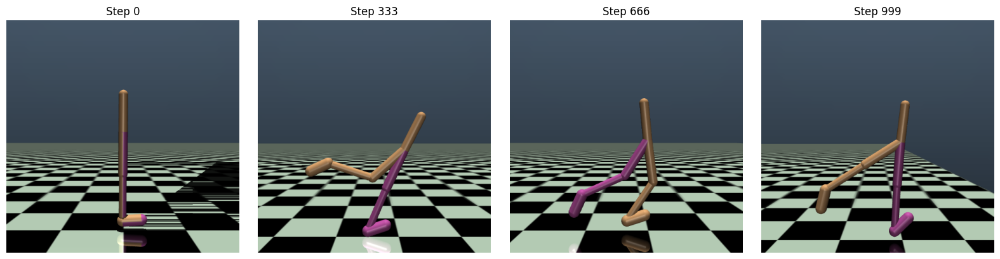

In [14]:
# Render one episode
frames, episode_reward = render_episode(model, eval_env)
print(f"Episode reward: {episode_reward:.2f}")
print(f"Episode length: {len(frames)} steps")

# %% Display some frames
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
frame_indices = [0, len(frames)//3, 2*len(frames)//3, len(frames)-1]

for ax, idx in zip(axes, frame_indices):
    ax.imshow(frames[idx])
    ax.set_title(f"Step {idx}")
    ax.axis('off')

plt.tight_layout()
plt.show()

GIF saved as 'walker2d_episode_PPO.gif'
File size: 14.30 MB
Number of frames: 500
Total duration: 25.0 seconds


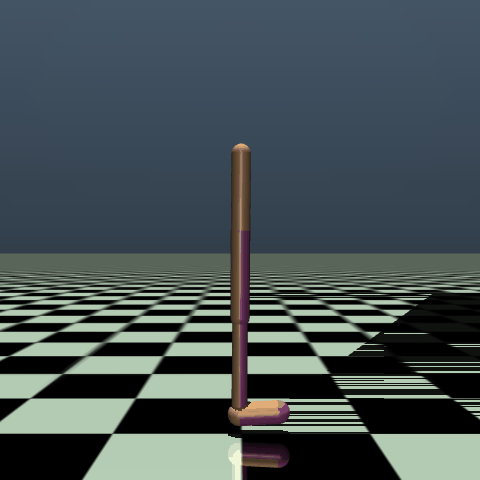

In [15]:


def create_gif(frames, filename='walker2d_episode_5M.gif', duration=50, downsample=2):
    """
    Create a GIF from frames
    
    Args:
        frames: List of numpy arrays (frames)
        filename: Output filename
        duration: Duration per frame in milliseconds
        downsample: Keep every Nth frame (reduces file size)
    """
    # Downsample frames to reduce file size
    frames_downsampled = frames[::downsample]
    
    # Convert frames to PIL Images
    pil_frames = [Image.fromarray(frame) for frame in frames_downsampled]
    
    # Save as GIF
    pil_frames[0].save(
        filename,
        save_all=True,
        append_images=pil_frames[1:],
        duration=duration,
        loop=0  # 0 means loop forever
    )
    
    file_size = os.path.getsize(filename) / (1024 * 1024)  # Size in MB
    print(f"GIF saved as '{filename}'")
    print(f"File size: {file_size:.2f} MB")
    print(f"Number of frames: {len(pil_frames)}")
    print(f"Total duration: {len(pil_frames) * duration / 1000:.1f} seconds")

# Create the GIF
create_gif(frames, filename='walker2d_episode_PPO.gif', duration=50, downsample=2)

# Display the GIF in Jupyter (optional)
from IPython.display import Image as IPImage, display
display(IPImage(filename='walker2d_episode_PPO.gif'))

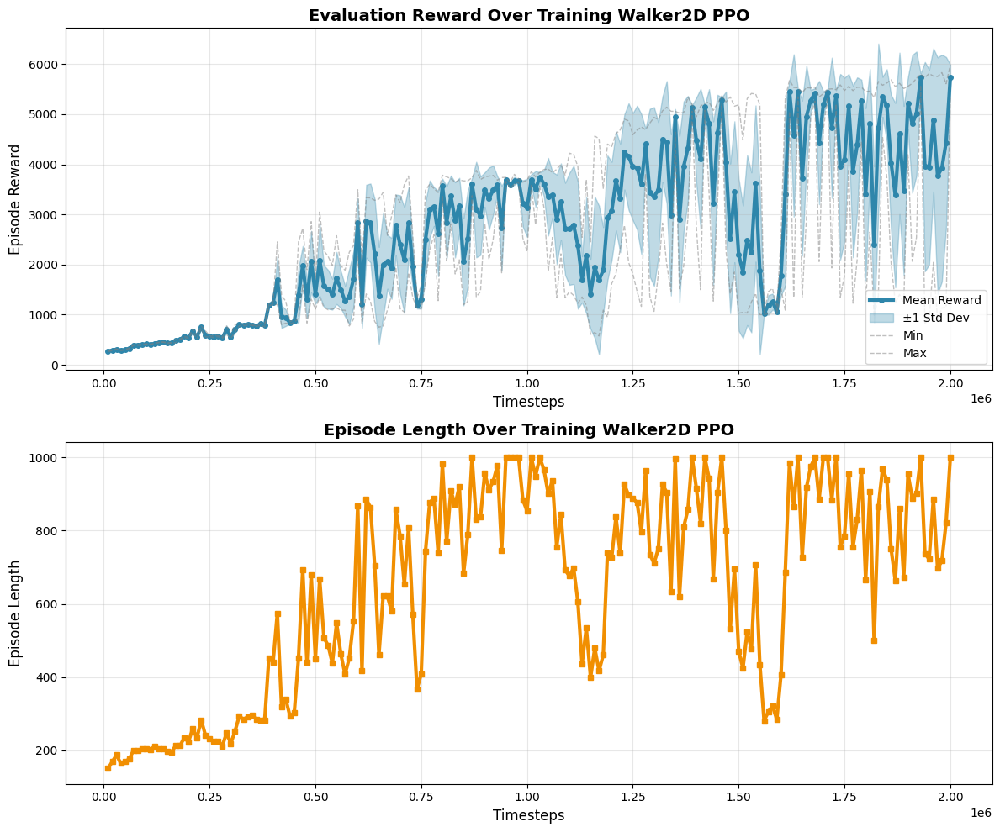


TRAINING SUMMARY
Initial Reward (mean): 270.50 ± 5.59
Final Reward (mean):   5731.49 ± 259.54
Best Reward (max):     5979.76 at 2000000 steps
Improvement:           5460.99 (2018.8%)
Total Training Steps:  2,000,000


In [16]:
def plot_evaluation_results(eval_log_path='./logs/eval/evaluations.npz'):
    """Plot evaluation results over time"""
    
    if not os.path.exists(eval_log_path):
        print(f"Evaluation log not found at {eval_log_path}")
        return
    
    # Load evaluation data
    data = np.load(eval_log_path)
    timesteps = data['timesteps']
    results = data['results']  # Shape: (n_evals, n_eval_episodes)
    ep_lengths = data['ep_lengths']
    
    # Calculate statistics
    mean_rewards = results.mean(axis=1)
    std_rewards = results.std(axis=1)
    min_rewards = results.min(axis=1)
    max_rewards = results.max(axis=1)
    
    # Create figure
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))
    
    # Plot 1: Reward over time with confidence interval
    axes[0].plot(timesteps, mean_rewards, linewidth=3, color='#2E86AB', 
                label='Mean Reward', marker='o', markersize=4)
    axes[0].fill_between(timesteps, 
                         mean_rewards - std_rewards, 
                         mean_rewards + std_rewards, 
                         alpha=0.3, color='#2E86AB', label='±1 Std Dev')
    axes[0].plot(timesteps, min_rewards, '--', linewidth=1, color='gray', 
                alpha=0.5, label='Min')
    axes[0].plot(timesteps, max_rewards, '--', linewidth=1, color='gray', 
                alpha=0.5, label='Max')
    
    axes[0].set_title('Evaluation Reward Over Training Walker2D PPO', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Timesteps', fontsize=12)
    axes[0].set_ylabel('Episode Reward', fontsize=12)
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)
    
    # Plot 2: Episode length over time
    mean_lengths = ep_lengths.mean(axis=1)
    axes[1].plot(timesteps, mean_lengths, linewidth=3, color='#F18F01', 
                marker='s', markersize=4)
    axes[1].set_title('Episode Length Over Training Walker2D PPO', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Timesteps', fontsize=12)
    axes[1].set_ylabel('Episode Length', fontsize=12)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('evaluation_progress.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("TRAINING SUMMARY")
    print("="*60)
    print(f"Initial Reward (mean): {mean_rewards[0]:.2f} ± {std_rewards[0]:.2f}")
    print(f"Final Reward (mean):   {mean_rewards[-1]:.2f} ± {std_rewards[-1]:.2f}")
    print(f"Best Reward (max):     {max_rewards.max():.2f} at {timesteps[max_rewards.argmax()]} steps")
    print(f"Improvement:           {mean_rewards[-1] - mean_rewards[0]:.2f} ({((mean_rewards[-1]/mean_rewards[0] - 1)*100):.1f}%)")
    print(f"Total Training Steps:  {timesteps[-1]:,}")
    print("="*60)

# Plot evaluation results
plot_evaluation_results('./logs/eval/evaluations.npz')

In [17]:
import pandas as pd
filename =f'./logs/walker_PPO_{timestamp}.monitor.csv'

try:
    df = pd.read_csv(filename, skiprows=1)
except:
    # Fallback: manual parsing
    data = []
    with open(filename, 'r') as f:
        next(f)  # Skip metadata line
        next(f)  # Skip header
        for line in f:
            try:
                parts = line.strip().split(',')
                if len(parts) >= 3:
                    r, l, t = float(parts[0]), int(parts[1]), float(parts[2])
                    data.append({'r': r, 'l': l, 't': t})
            except:
                continue
    df = pd.DataFrame(data)

In [18]:
solved_threshold = 6000
rolling_window = 100

df["moving_reward"] = df["r"].rolling(window=rolling_window).mean()

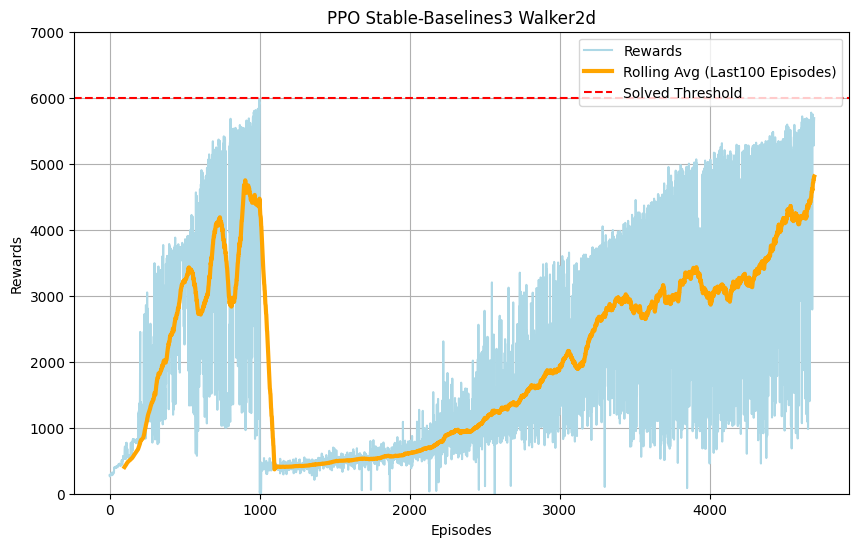

In [19]:
# Plot rewards with rolling average

plt.figure(figsize=(10, 6))
plt.plot(df['r'], label='Rewards', color='lightblue')
plt.plot(df['moving_reward'], label='Rolling Avg (Last'+str(rolling_window)+' Episodes)', color='orange',
        linewidth=3)
plt.axhline(y=solved_threshold, color='red', linestyle='--', label='Solved Threshold')
plt.title('PPO Stable-Baselines3 Walker2d')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.ylim(0,7000)
plt.legend()
plt.grid()
plt.show()

In [20]:
import session_info
session_info.show(html=False)

-----
PIL                 10.4.0
gymnasium           1.2.1
matplotlib          3.9.1
numpy               1.26.4
pandas              2.2.2
session_info        1.0.0
stable_baselines3   2.7.0
torch               2.4.0+cu121
-----
IPython             8.26.0
jupyter_client      8.6.3
jupyter_core        5.7.2
jupyterlab          4.4.9
notebook            7.4.7
-----
Python 3.12.3 (main, Aug 14 2025, 17:47:21) [GCC 13.3.0]
Linux-6.6.87.2-microsoft-standard-WSL2-x86_64-with-glibc2.39
-----
Session information updated at 2025-10-27 10:30
